In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [3]:
train = pd.read_csv("train.csv")
train.head()

,id,brand,model,model_year,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title,price
0,0,Ford,F-150 Lariat,2018,74349,Gasoline,375.0HP 3.5L V6 Cylinder Engine Gasoline Fuel,10-Speed A/T,Blue,Gray,None reported,Yes,11000
1,1,BMW,335 i,2007,80000,Gasoline,300.0HP 3.0L Straight 6 Cylinder Engine Gasoli...,6-Speed M/T,Black,Black,None reported,Yes,8250
2,2,Jaguar,XF Luxury,2009,91491,Gasoline,300.0HP 4.2L 8 Cylinder Engine Gasoline Fuel,6-Speed A/T,Purple,Beige,None reported,Yes,15000
3,3,BMW,X7 xDrive40i,2022,2437,Hybrid,335.0HP 3.0L Straight 6 Cylinder Engine Gasoli...,Transmission w/Dual Shift Mode,Gray,Brown,None reported,Yes,63500
4,4,Pontiac,Firebird Base,2001,111000,Gasoline,200.0HP 3.8L V6 Cylinder Engine Gasoline Fuel,A/T,White,Black,None reported,Yes,7850


In [4]:
# Check for features and samples
print("The dataset has {} rows and {} columns".format(train.shape[0], train.shape[1]))

The dataset has 54273 rows and 13 columns


In [5]:
# Check for missing values
print("The dataset has {} missing values".format(train.isnull().sum().sum()))

The dataset has 0 missing values


In [6]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54273 entries, 0 to 54272
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   id            54273 non-null  int64 
 1   brand         54273 non-null  object
 2   model         54273 non-null  object
 3   model_year    54273 non-null  int64 
 4   milage        54273 non-null  int64 
 5   fuel_type     54273 non-null  object
 6   engine        54273 non-null  object
 7   transmission  54273 non-null  object
 8   ext_col       54273 non-null  object
 9   int_col       54273 non-null  object
 10  accident      54273 non-null  object
 11  clean_title   54273 non-null  object
 12  price         54273 non-null  int64 
dtypes: int64(4), object(9)
memory usage: 5.4+ MB


In [7]:
# Check the descriptive statistics of the dataset and use some colours on the layout
train.describe().style.background_gradient(cmap='coolwarm')

,id,model_year,milage,price
count,54273.000000,54273.000000,54273.000000,54273.000000
mean,27136.000000,2015.091979,72746.175667,39218.443333
std,15667.409917,5.588909,50469.490448,72826.335535
min,0.000000,1974.000000,100.000000,2000.000000
25%,13568.000000,2012.000000,32268.000000,15500.000000
50%,27136.000000,2016.000000,66107.000000,28000.000000
75%,40704.000000,2019.000000,102000.000000,45000.000000
max,54272.000000,2024.000000,405000.000000,2954083.000000


## Visualization

<Axes: ylabel='count'>

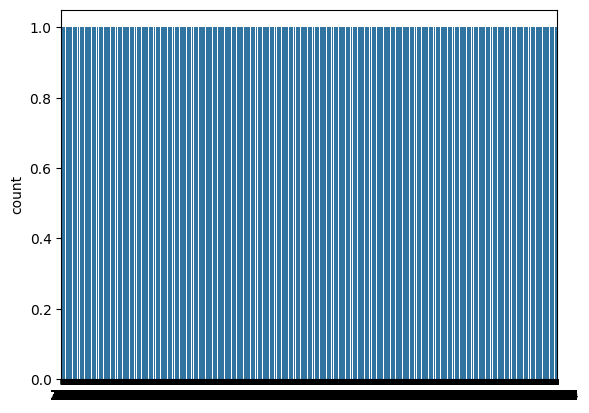

In [8]:
# Check the distribution of the target variable
sns.countplot(train['price'])

<Axes: xlabel='milage', ylabel='price'>

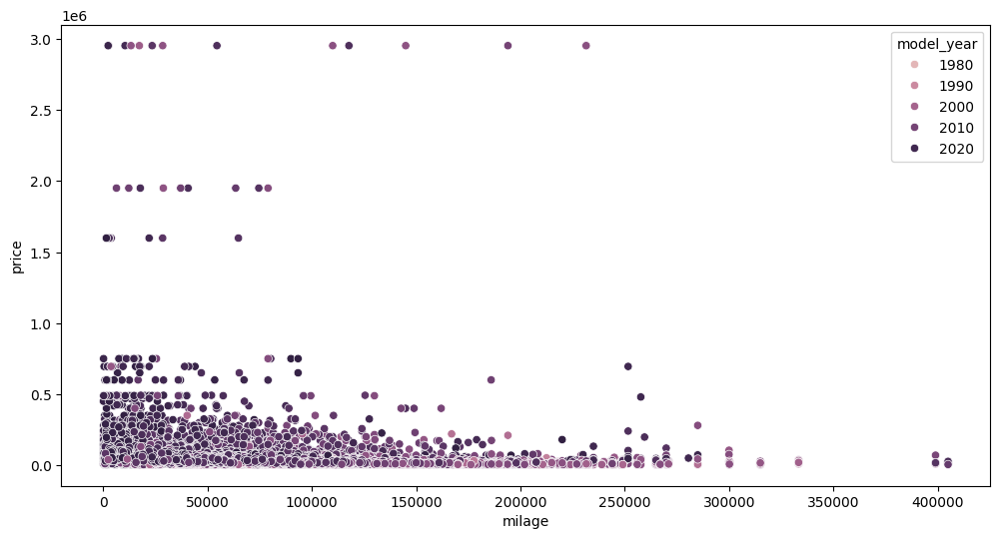

In [11]:
# Check the mileage, the vehicle model year and the price
plt.figure(figsize=(12, 6))
sns.scatterplot(x='milage', y='price', hue='model_year', data=train)

<Axes: xlabel='fuel_type', ylabel='price'>

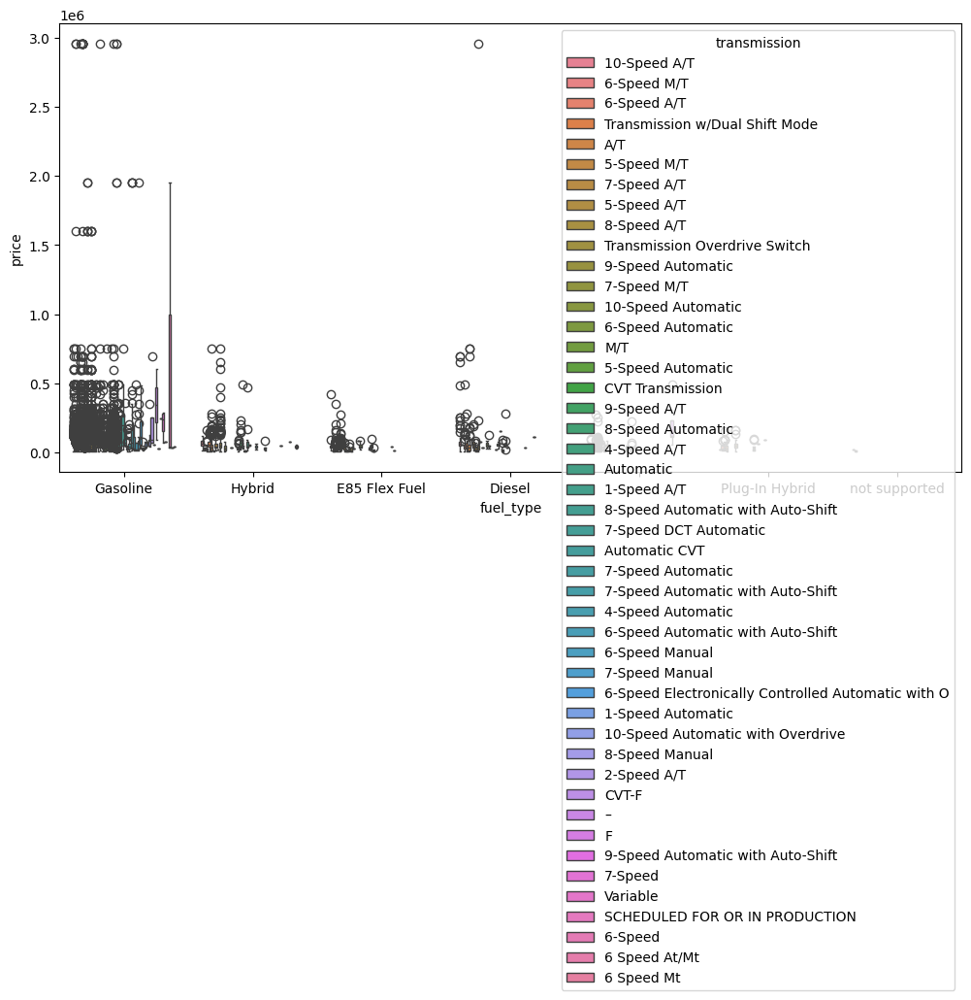

In [12]:
# Check the fuel type, the transmission type and the price
plt.figure(figsize=(12, 6))
sns.boxplot(x='fuel_type', y='price', hue='transmission', data=train)

<Axes: xlabel='brand'>

<Figure size 1200x600 with 0 Axes>

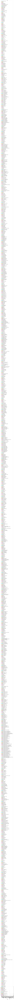

: 

In [13]:
# A stacked bar graph of each brand with the respective models
plt.figure(figsize=(12, 6))
train.groupby(['brand', 'model']).size().unstack().plot(kind='bar', stacked=True)

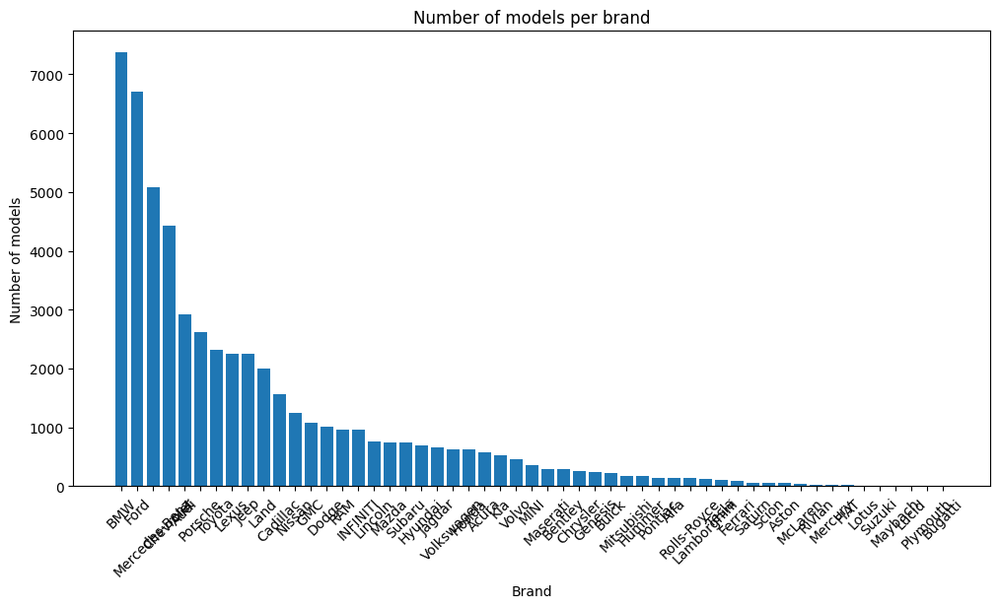

In [4]:
# Which brand has the most models using a bar graph with side-to-side bars
plt.figure(figsize=(12,6))
plt.title('Number of models per brand')
plt.xlabel('Brand')
plt.ylabel('Number of models')

# Since the brands are many, we will create a function to plot the bar graph
def plot_bar_graph(data, x, y, title, xlabel, ylabel):
    plt.bar(data[x], data[y])
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.xticks(rotation=45)
    plt.show()

# Count the number of models per brand
models_per_brand = train['brand'].value_counts().reset_index()
models_per_brand.columns = ['brand', 'count']

# Plot the bar graph
plot_bar_graph(models_per_brand, 'brand', 'count', 'Number of models per brand', 'Brand', 'Number of models')



<Axes: xlabel='brand'>

<Figure size 1200x600 with 0 Axes>

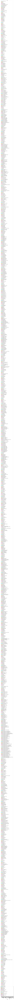

In [5]:
# Grouped bar chart of different models of each brand
plt.figure(figsize=(12, 6))
train.groupby(['brand', 'model']).size().unstack().plot(kind='bar')

In [6]:
# Correlation of the features with numerical data only
plt.figure(figsize=(12, 6))

ValueError: could not convert string to float: 'Ford'

<Figure size 1200x600 with 0 Axes>